In [212]:
# Import libraries necessary for this project
import missingno as msno
import numpy as np
import pandas as pd
import scipy as sp
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from scipy.stats import norm, skew 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Import visualisation libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Allows the use of display() for DataFrames
from IPython.display import display 

# Ignore the warnings
import warnings
warnings.filterwarnings('ignore')

pd.set_option('max_columns',100)
pd.set_option('max_rows',100000)

# 데이터 숫자 소숫점 표시
pd.options.display.float_format = '{:.2f}'.format 

In [213]:
%%time
# read_csv
raw_data = pd.read_csv('vehicles.csv')
raw_data.shape # (509577, 25)

CPU times: user 10.1 s, sys: 498 ms, total: 10.6 s
Wall time: 9.2 s


(509577, 25)

In [214]:
# 제외 항목 제거 
raw_data.drop(['url', 'region', 'region_url', 'condition', 'size', 
               'image_url', 'description', 'county', 'lat', 'long'], axis=1, inplace=True)
# 결측 행 제거 (186877, 14)
raw_data = raw_data.dropna(axis=0)
# vin 중복 제거 
raw_data = raw_data.loc[raw_data.drop_duplicates('vin', keep='last').index]
# year 정수로 변환
raw_data['year'] = raw_data['year'].astype('int32')
print(raw_data.shape)

(77339, 15)


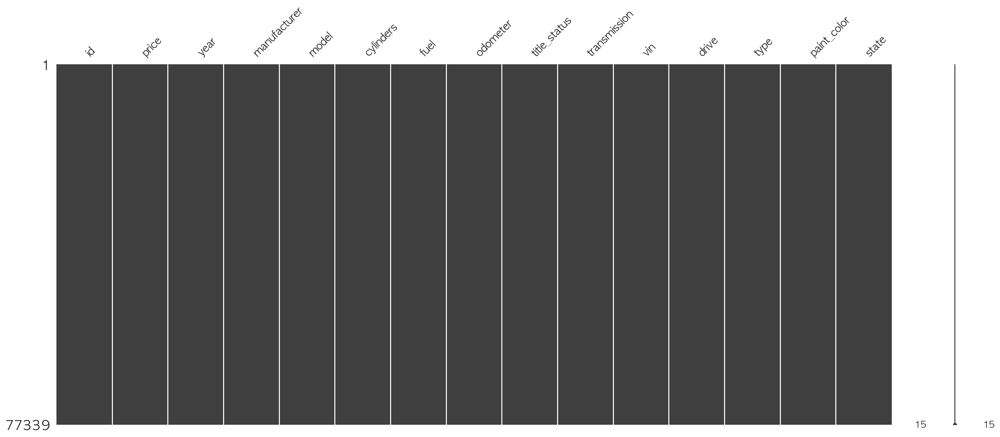

In [4]:
msno.matrix(raw_data)
plt.show()

In [6]:
# OLS 분석 : 조건수 8억
model = sm.OLS.from_formula("price ~ year + manufacturer + cylinders + fuel \
+ odometer + title_status + transmission + drive + type \
+ paint_color + state + 0", data=raw_data)

result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.310
Date:                Thu, 26 Mar 2020   Prob (F-statistic):            0.00899
Time:                        15:35:37   Log-Likelihood:            -1.3755e+06
No. Observations:               77339   AIC:                         2.751e+06
Df Residuals:                   77202   BIC:                         2.753e+06
Df Model:                         136                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
manufacturer[a

In [7]:
# 조건수가 8억이여서 실수형 독립변수의 표준편차를 확인
# 실수형 독립변수 주행거리의 표준편차(std) : 112704
X = raw_data[['year', 'manufacturer', 'cylinders', 'fuel', 'odometer', \
              'title_status', 'transmission', 'drive', 'type', 'paint_color', \
             'state']]
X.describe().loc["std"]

year            6.90
odometer   100581.53
Name: std, dtype: float64

In [8]:
# 종속변수의 표준편차 : 11889882
y = raw_data[['price']]
y.describe().loc['std']

price   12833244.44
Name: std, dtype: float64

In [9]:
# 가중치 벡터의 값
result.params

manufacturer[acura]             10434164.50
manufacturer[alfa-romeo]        10421544.52
manufacturer[aston-martin]      10855090.28
manufacturer[audi]              10540612.34
manufacturer[bmw]               10563075.22
manufacturer[buick]             10539574.56
manufacturer[cadillac]          10552691.98
manufacturer[chevrolet]         10516650.85
manufacturer[chrysler]          10530368.73
manufacturer[datsun]             9355507.21
manufacturer[dodge]             10539882.31
manufacturer[ferrari]           10652605.57
manufacturer[fiat]               9857190.34
manufacturer[ford]              10496026.57
manufacturer[gmc]               10531011.07
manufacturer[harley-davidson]   10413284.32
manufacturer[honda]             10393018.37
manufacturer[hyundai]           10474759.20
manufacturer[infiniti]          10481832.62
manufacturer[jaguar]            10660776.05
manufacturer[jeep]              10436652.21
manufacturer[kia]               10452142.42
manufacturer[land rover]        

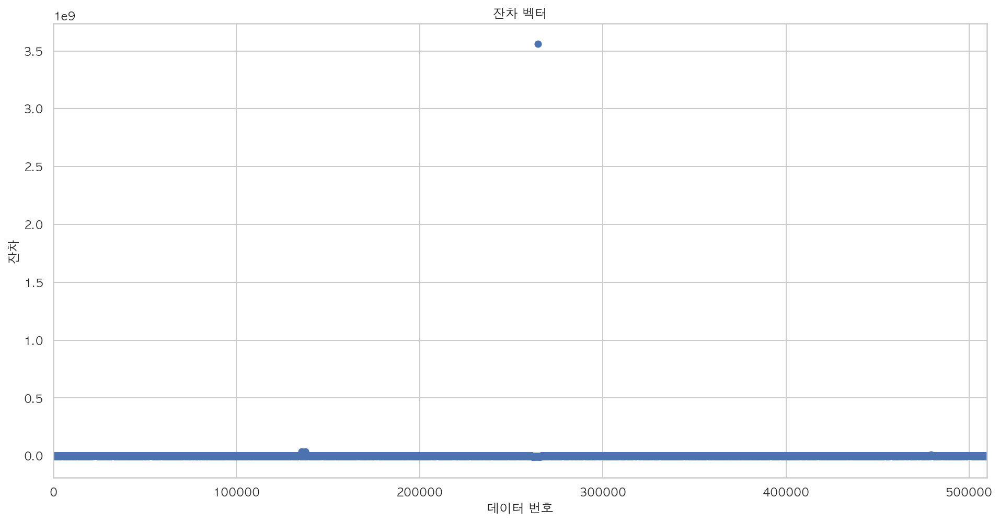

In [10]:
# 잔차 벡터의 형태
result.resid.plot(style="o", figsize=(16,8))
plt.title("잔차 벡터")
plt.xlabel("데이터 번호")
plt.ylabel("잔차")
plt.show()

In [11]:
# 스케일링 후 컨디션 넘버가 596으로 줄어듬
# 연도 데이터가 숫자이므로 연속값으로 인식하지 않도록 C() 연산자를 사용함
model = sm.OLS.from_formula("scale(price) ~ C(year) + C(manufacturer) \
+ C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) \
+ C(drive) + C(type) + C(paint_color) + C(state) + 0", data=raw_data)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           scale(price)   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.189
Date:                Thu, 26 Mar 2020   Prob (F-statistic):             0.0270
Time:                        15:36:19   Log-Likelihood:            -1.0960e+05
No. Observations:               77339   AIC:                         2.197e+05
Df Residuals:                   77112   BIC:                         2.218e+05
Df Model:                         226                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
C(ye

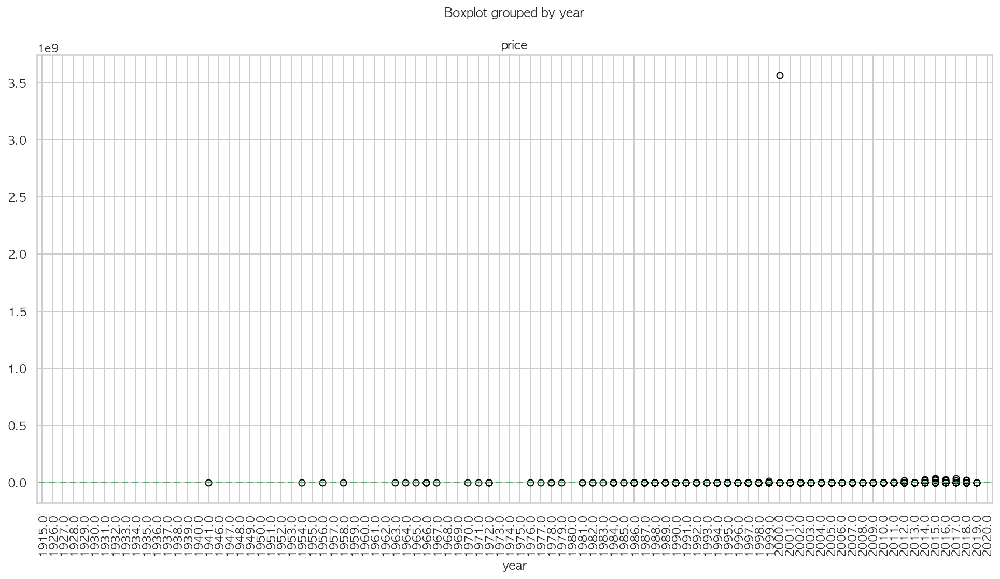

In [12]:
# y축 종속변수, x축 독립변수 연도
raw_data.boxplot("price", "year", rot=90, figsize=(16,8))
plt.show()

#### 첫번째 데이터 전처리

- 가격: 100 이하 값, 100만 이상 값, 연속/중복된 숫자 값
- 연도: 0인 값
- 주행거리: 100 이하 값, 100만 이상 값

In [217]:
# price : $100 이하, $100만 이상 제거
raw_data = raw_data[(raw_data['price'] > 100) & (raw_data['price'] <= 1000000)]

# price : 1 ~ 9까지 중복된 숫자 제거
price_duple = raw_data[raw_data['price']
                       .isin([1, 11, 111, 1111, 11111, 111111, 1111111, 11111111, 111111111, 
                              2, 22, 222, 2222, 22222, 222222, 2222222, 22222222, 222222222, 
                              3, 33, 333, 3333, 33333, 333333, 3333333, 33333333, 333333333, 
                              4, 44, 444, 4444, 44444, 444444, 4444444, 44444444, 444444444, 
                              5, 55, 555, 5555, 55555, 555555, 5555555, 55555555, 555555555, 
                              6, 66, 666, 6666, 66666, 666666, 6666666, 66666666, 666666666, 
                              7, 77, 777, 7777, 77777, 777777, 7777777, 77777777, 777777777, 
                              8, 88, 888, 8888, 88888, 888888, 8888888, 88888888, 888888888, 
                              9, 99, 999, 9999, 99999, 999999, 9999999, 99999999, 999999999])].index
raw_data.drop(price_duple, inplace=True)

# price : 1 ~ 9까지 연속된 숫자 제거
price_iter = raw_data[raw_data['price']
                      .isin([12, 123, 1234, 12345, 123456, 1234567, 12345678, 123456789,  
                             23, 234, 2345, 23456, 234567, 2345678, 23456789, 
                             34, 345, 3456, 34567, 345678, 3456789, 
                             45, 456, 4567, 45678, 456789, 
                             56, 567, 5678, 56789, 
                             67, 678, 6789, 
                             78, 789, 
                             89, 
                             90,
                             98, 987, 9876, 98765, 987654, 9876543, 98765432, 987654321, 
                             87, 876, 8765, 87654, 876543, 8765432, 87654321, 
                             76, 765, 7654, 76543, 765432, 7654321, 
                             65, 654, 6543, 65432, 654321, 
                             54, 543, 5432, 54321, 
                             43, 432, 4321, 
                             32, 321, 
                             21])].index
raw_data.drop(price_iter, inplace=True)

# year : 0값, 2020년, 2021년 데이터 제거
# raw_data = raw_data[(raw_data['year'] != 0) & (raw_data['year'] != 2020) & (raw_data['year'] != 2021)]
raw_data = raw_data[(raw_data['year'] != 0) & (raw_data['year'] != 2021)]

# odometer : 0값, 100이하, 100만 마일 이상 데이터 제거
raw_data = raw_data[(raw_data['odometer'] != 0) & (raw_data['odometer'] >= 100) & (raw_data['odometer'] <= 1000000)]
print()
print('='*100)
print('전처리 후 갯수 : ', len(raw_data)) # 169914개, 모델 컬럼 추가 후 : 168780개
print()


전처리 후 갯수 :  71061



#### price 데이터 분석

In [198]:
raw_data['price'].describe()

count     71061.00
mean      13480.19
std       11401.28
min         115.00
25%        5995.00
50%       10950.00
75%       17995.00
max     1000000.00
Name: price, dtype: float64

In [190]:
import plotly.express as px
fig = px.histogram(raw_data, x='year')
fig.show()

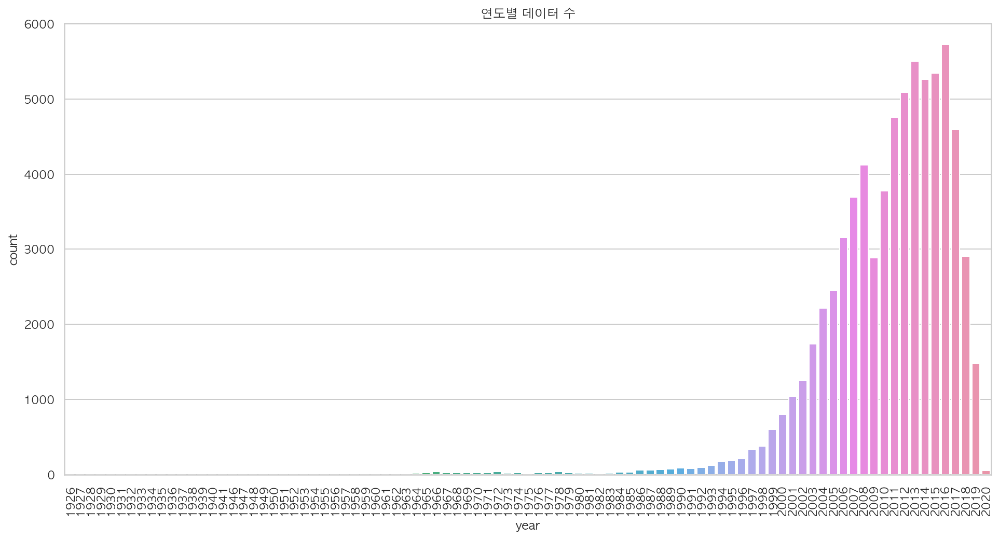

In [218]:
plt.figure(figsize=(16,8))
ax = sns.countplot(x='year', data=raw_data)
plt.title('연도별 데이터 수')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

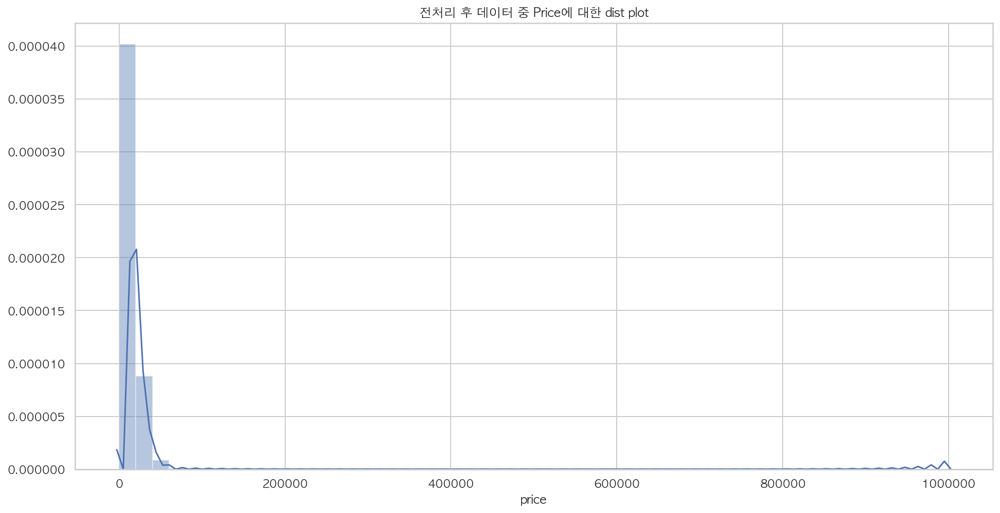

CPU times: user 403 ms, sys: 10.2 ms, total: 413 ms
Wall time: 412 ms


In [15]:
%%time
# price dist plot
plt.figure(figsize=(16,8))
sns.distplot(raw_data['price'], kde=True)
plt.title('전처리 후 데이터 중 Price에 대한 dist plot')
plt.show()

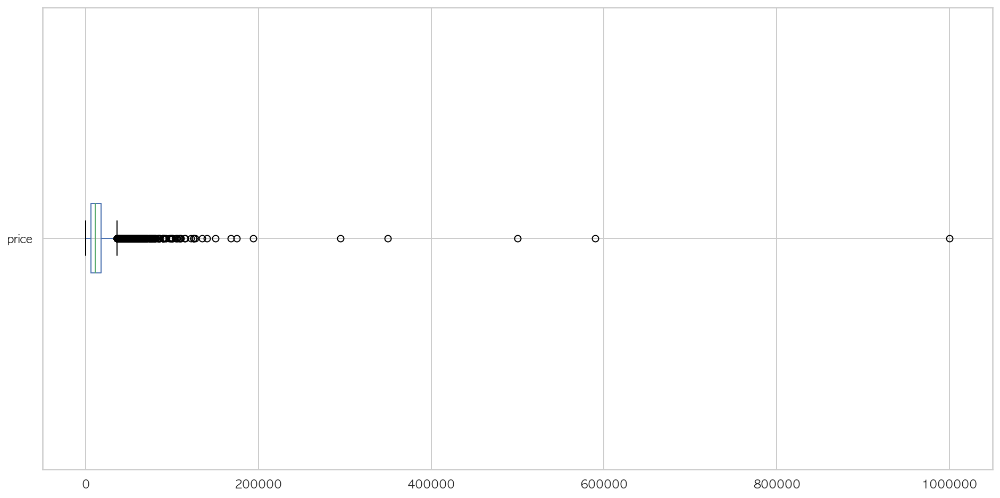

In [16]:
# price 박스플롯
raw_data.boxplot('price', vert=0, figsize=(16,8));

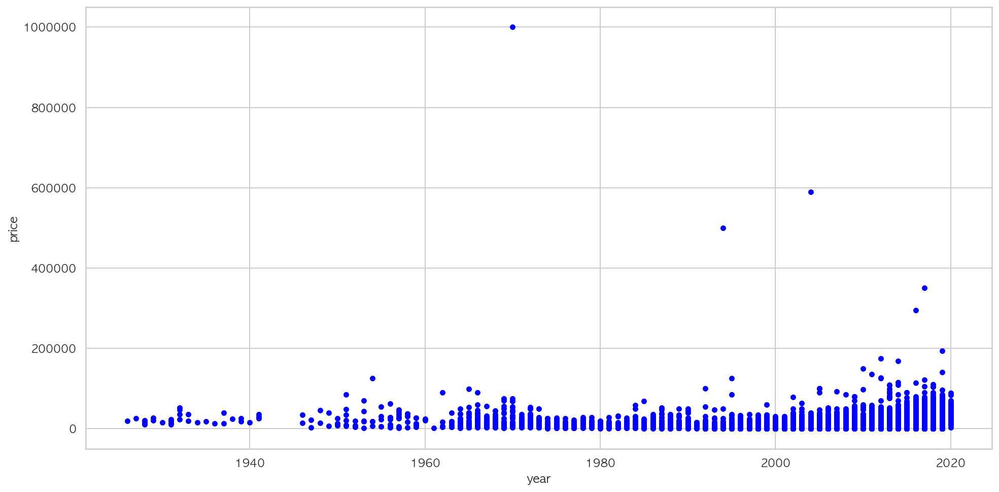

In [219]:
raw_data.plot.scatter(x='year', y='price', c='blue', figsize=(16,8));

#### price 추가 10만 이상 삭제

In [220]:
len(raw_data[raw_data['price'] >= 100000])

26

In [221]:
raw_data = raw_data[(raw_data['price'] < 100000) | (raw_data['id'].isin([7033472903,7039773014,7049284671,7043599850,7049033507,\
                                 7036156093,7049707044,7048009986,7041367828,7047810612,7045671330,7047378977]))]
len(raw_data)

71047

#### 실린더 컬럼 value의 숫자 분리

In [209]:
# 실린더 현황 파악
raw_data['cylinders'].value_counts()

6 cylinders     26141
4 cylinders     24336
8 cylinders     19273
5 cylinders       643
10 cylinders      296
other             226
3 cylinders       125
12 cylinders       21
Name: cylinders, dtype: int64

In [210]:
raw_data[raw_data['cylinders'] == 'other'].tail()

,id,price,year,manufacturer,model,cylinders,fuel,odometer,title_status,transmission,vin,drive,type,paint_color,state
487926,7049663543,36990,2018.00,jeep,wrangler unlimited sport s,other,gas,21749.00,clean,automatic,1C4HJWDG8JL930836,4wd,SUV,silver,tx
487944,7049662630,36990,2018.00,jeep,wrangler unlimited golden eagle,other,gas,6329.00,clean,automatic,1C4BJWDG4JL897369,4wd,SUV,brown,tx
488823,7049352501,49900,2016.00,tesla,s 90d,other,electric,419967.00,lien,automatic,5YJSA1E28GF136569,4wd,sedan,brown,tx
495531,7048991198,31999,2013.00,tesla,s 85,other,gas,85000.00,clean,automatic,5YJSA1CN3DFP18135,rwd,sedan,white,tx
496375,7049075648,2750,1968.00,ford,mustang,other,gas,123456.00,clean,other,8T01T118800,rwd,coupe,green,tx


In [222]:
import re
def cylinders(raw_data):
    if type(raw_data['cylinders']) is str:
        cyl = re.findall(r"(\d) cylinders", raw_data['cylinders'])
        if len(cyl) != 0:
            return int(cyl[0])
        else:
            return -1
    else:
        return -1
    
raw_data['cylinders'] = raw_data.apply(cylinders,axis=1)
raw_data['cylinders'].tail()

509547    6
509548    8
509551    4
509555    6
509574    4
Name: cylinders, dtype: int64

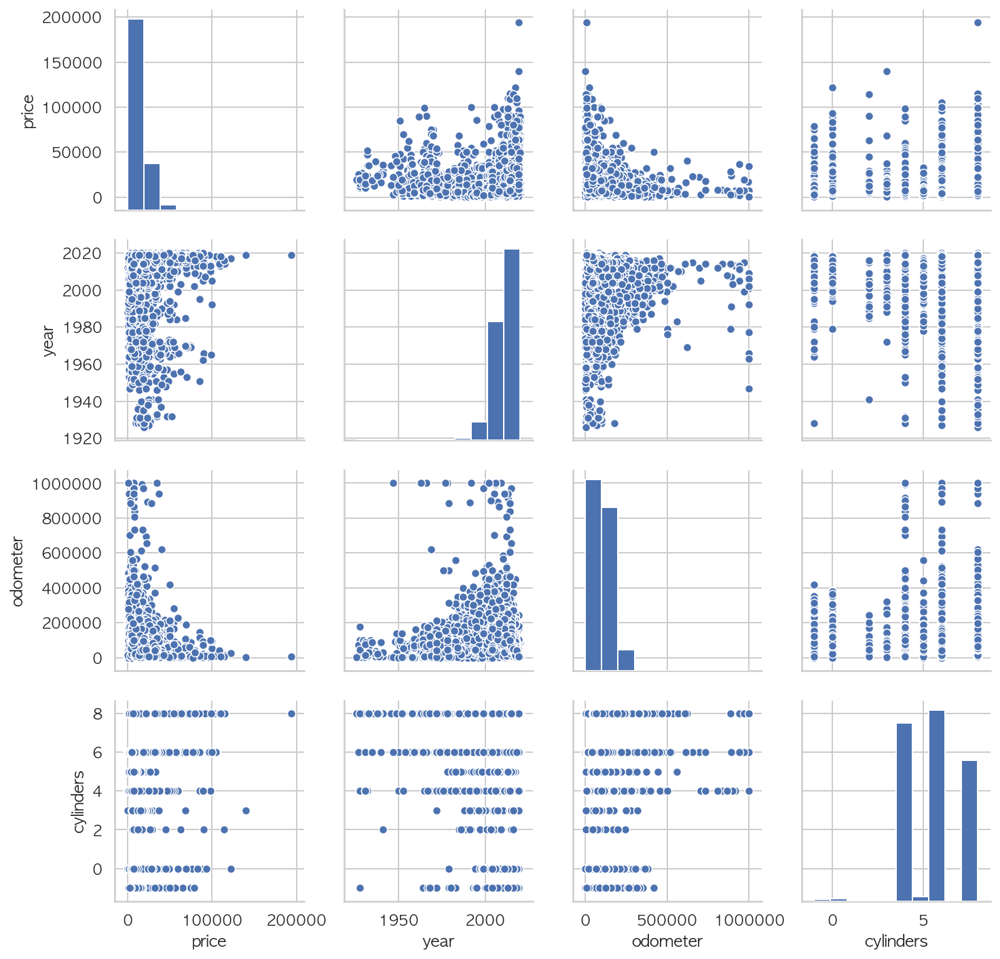

<Figure size 1152x576 with 0 Axes>

In [223]:
# 종속변수와 실수형 독립변수의 관계 확인
sns.pairplot(raw_data[["price", "year", "odometer", "cylinders"]])
plt.figure(figsize=(16,8))
plt.show()

In [231]:
raw_data['cylinders'].notnull().sum()

71047

In [237]:
raw_data[raw_data['id'] == 7049352501]

,id,price,year,manufacturer,model,cylinders,fuel,odometer,title_status,transmission,vin,drive,type,paint_color,state
488823,7049352501,49900,2016,tesla,s 90d,-1,electric,419967.00,lien,automatic,5YJSA1E28GF136569,4wd,sedan,brown,tx


In [238]:
# 축소랭크 스케일링
from sklearn.model_selection import train_test_split

df = raw_data
def get_model1(seed):
    df_train, df_test = train_test_split(df, test_size=0.5, random_state=seed)
    model = sm.OLS.from_formula("scale(price) ~ C(year) + C(manufacturer) \
+ C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) \
+ C(drive) + C(type) + C(paint_color) + C(state)", data=df_train)
    return df_train, df_test, model.fit()

df_train, df_test, result1 = get_model1(3)
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:           scale(price)   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     442.4
Date:                Sat, 28 Mar 2020   Prob (F-statistic):               0.00
Time:                        16:04:09   Log-Likelihood:                -26954.
No. Observations:               35523   AIC:                         5.435e+04
Df Residuals:                   35303   BIC:                         5.621e+04
Df Model:                         219                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [239]:
# ANOVA 분석
sm.stats.anova_lm(result)

,df,sum_sq,mean_sq,F,PR(>F)
C(year),87.00,14441.81,166.00,619.76,0.00
C(manufacturer),40.00,3897.62,97.44,363.80,0.00
C(cylinders),7.00,3731.03,533.00,1989.99,0.00
C(fuel),4.00,1506.02,376.50,1405.69,0.00
C(title_status),5.00,100.44,20.09,75.00,0.00
C(transmission),2.00,178.58,89.29,333.36,0.00
C(drive),2.00,564.55,282.27,1053.88,0.00
C(type),12.00,460.99,38.42,143.43,0.00
C(paint_color),11.00,15.41,1.40,5.23,0.00
C(state),50.00,235.26,4.71,17.57,0.00


In [240]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           scale(price)   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     440.4
Date:                Sat, 28 Mar 2020   Prob (F-statistic):               0.00
Time:                        16:10:31   Log-Likelihood:                -26895.
No. Observations:               35523   AIC:                         5.423e+04
Df Residuals:                   35301   BIC:                         5.612e+04
Df Model:                         221                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

ValueError: operands could not be broadcast together with shapes (35523,) (14895,15) 

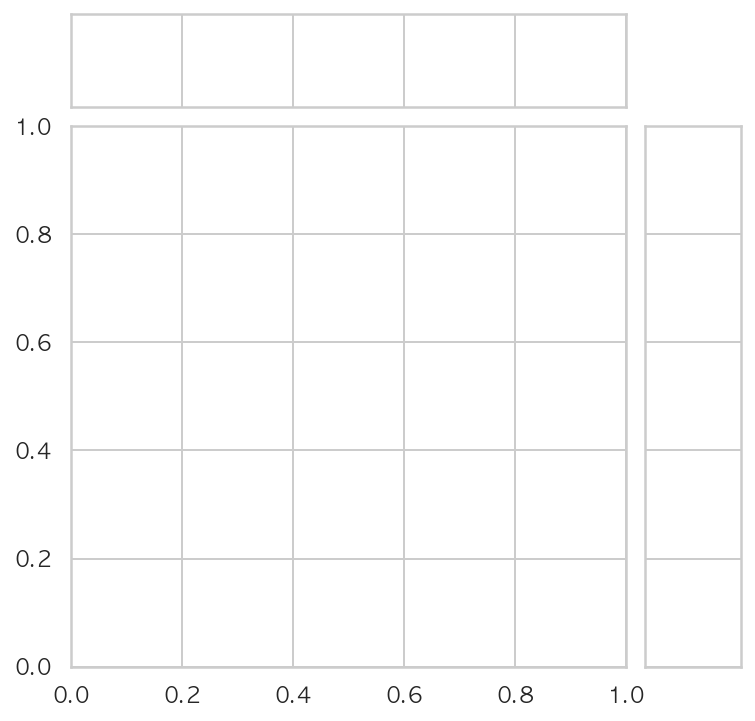

In [262]:
sns.jointplot(result.fittedvalues, y)
plt.show()

In [ ]:
# 가격 

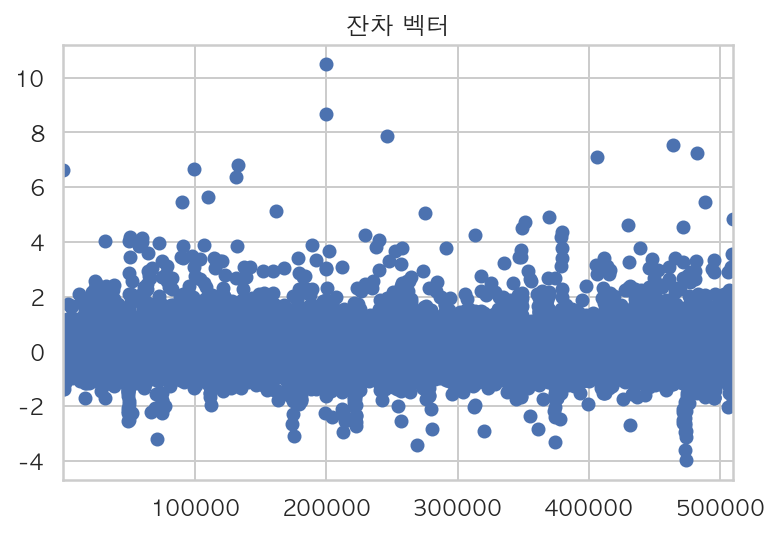

In [266]:
result.resid.plot(style='o')
plt.title('잔차 벡터')
plt.show()

In [265]:
y.mean()

id         7043867379.23
price           22782.62
year             2014.85
odometer        29190.34
dtype: float64

In [ ]:
dfX = pd.DataFrame(raw_data, columns=raw_data.columns)
dfy = pd.DataFrame(raw_data, )

#### 종속변수 추가 전처리 - vin 정보로 올바른 가격인지 확인

In [106]:
raw_data[(raw_data['price'] > 100000) | (raw_data['odometer'] < 50000)].sort_values

<bound method DataFrame.sort_values of                 id   price    year     manufacturer  \
60      7033478714   28895 2016.00              ram   
61      7033472903  105500 2017.00    mercedes-benz   
94      7033233133    3250 2017.00             ford   
97      7033228648   14800 2019.00        chevrolet   
99      7033225686    6995 2017.00            dodge   
102     7033206570    5995 2018.00              kia   
130     7032825687   30995 2019.00             ford   
146     7050005015   17500 2018.00           toyota   
171     7048798803    7500 1950.00            dodge   
191     7048497716   22500 2016.00             ford   
224     7047420562   20495 2018.00            honda   
251     7047169493   10500 1986.00        chevrolet   
273     7046091125   15350 2017.00           nissan   
305     7044990857    9995 2012.00            honda   
326     7042516837   20495 2017.00            mazda   
356     7041667520    6995 2015.00             ford   
357     7041667144    5995

In [82]:
raw_data.sort_values(by='price')[:500]

,id,price,year,manufacturer,model,cylinders,fuel,odometer,title_status,transmission,vin,drive,type,paint_color,state
362143,7041868348,115,2007.00,hyundai,santa fe,6 cylinders,other,65580.00,clean,automatic,5NMSH13E27H086632,fwd,other,white,nm
362463,7040796068,115,2005.00,toyota,camry xle,6 cylinders,other,98316.00,clean,automatic,4T1BF30KX5U104596,fwd,sedan,red,nm
220950,7047899575,122,2016.00,ford,fiesta,4 cylinders,gas,86863.00,clean,automatic,3FADP4BJ9GM165472,fwd,sedan,grey,il
252842,7040079832,131,2012.00,chevrolet,express 2500 work van,8 cylinders,other,220790.00,clean,automatic,1GCWGFBA8C1126880,rwd,van,white,ky
375666,7044612240,135,2011.00,volkswagen,cc sport,4 cylinders,gas,89908.00,clean,automatic,WVWMP7AN8BE726100,fwd,sedan,blue,ny
375667,7044612212,135,2012.00,honda,civic,4 cylinders,gas,81728.00,clean,automatic,2HGFB2F59CH575413,fwd,sedan,red,ny
375394,7045121566,139,2014.00,volkswagen,passat wolfsburg,4 cylinders,gas,91698.00,clean,automatic,1VWAT7A35EC032412,fwd,sedan,black,ny
375669,7044612225,139,2012.00,nissan,altima 2.5 s,4 cylinders,gas,80555.00,clean,automatic,1N4AL2AP1CN564708,fwd,sedan,silver,ny
174125,7047767821,140,2007.00,dodge,dakota st,6 cylinders,gas,82137.00,clean,automatic,1D7HE22K27S200686,rwd,pickup,red,fl
173909,7049101477,141,2004.00,ford,expedition eddie bauer,8 cylinders,gas,115374.00,clean,automatic,1FMFU17L64LB28179,rwd,other,red,fl


In [ ]:
titanic['age_cat'] = pd.cut(titanic['age'], bins=[0,7,15,30,60,100], 
include_lowest=True, labels=['baby', 'teen', 'young', 'adult', 'old'])
titanic.head()

In [ ]:
for idx, dataset in titanic.iterrows():
    print(dataset['name'])

In [ ]:
for idx, dtaset in titanic.iterrows():
    tmp = dataset['name']
    print(idx)
    print(re.search('\,\s\w+(\s\w+)?\.', tmp).group())

In [ ]:
title = []
for idx, dataset in titanic.iterrows():
    title.append(re.search('\,\s\w+(\s\w+)?\.', dataset['name']).group()[2:-1])

titanic['title'] = title
titanic.head()

In [174]:
raw_data.columns

Index(['id', 'price', 'year', 'manufacturer', 'model', 'cylinders', 'fuel',
       'odometer', 'title_status', 'transmission', 'vin', 'drive', 'type',
       'paint_color', 'state'],
      dtype='object')

In [ ]:
raw_data["sex"] = LabelEncoder().fit_transform(dfX["sex"])
dfX.tail()

#### 카테고리 독립변수 실수화

In [57]:
# 풀랭크 OLS
model = sm.OLS.from_formula("price ~ year + manufacturer \
+ cylinders + fuel + odometer + title_status + transmission \
+ drive + type + paint_color + state + 0", data=raw_data)
result = model.fit()
print(result.summary())

PatsyError: Error evaluating factor: IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices
    price ~ year + manufacturer + cylinders + fuel + odometer + title_status + transmission + drive + type + paint_color + state + 0
                                              ^^^^

In [61]:
raw_data.plot.scatter(raw_data['year'] < 1930, y=raw_data['price'])

KeyError: "None of [Int64Index([ 17899,   4600,   3995,  28895, 105500,   3250,  14800,   6995,\n              5995,   4000,\n            ...\n             10000,  18250,  32995,  34995,  31995,  33895,   6500,   7500,\n             32000,  24895],\n           dtype='int64', length=71047)] are in the [columns]"

In [58]:
# 풀랭크 OLS 스케일링
model = sm.OLS.from_formula("scale(price) ~ C(year) + C(manufacturer) \
+ C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) \
+ C(drive) + C(type) + C(paint_color) + C(state)", data=raw_data)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           scale(price)   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     863.9
Date:                Fri, 27 Mar 2020   Prob (F-statistic):               0.00
Time:                        11:19:48   Log-Likelihood:                -53909.
No. Observations:               71047   AIC:                         1.083e+05
Df Residuals:                   70821   BIC:                         1.103e+05
Df Model:                         225                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [ ]:
# %%time
# # 부분회귀 플롯
# fig = plt.figure(figsize=(8, 20))
# sm.graphics.plot_partregress_grid(result, fig=fig)
# fig.suptitle("")
# plt.show()

In [ ]:
# %%time
# # CCPR
# fig = plt.figure(figsize=(8, 15))
# sm.graphics.plot_ccpr_grid(result, fig=fig)
# fig.suptitle("")
# plt.show()

In [63]:
df = raw_data

In [208]:
len(df.columns)

15

In [180]:
# 카테고리 값 더미 변수화
dfX = pd.get_dummies(df[['year', 'manufacturer', 'cylinders', 'fuel', \
                        'title_status', 'transmission', 'drive', \
                        'type', 'paint_color', 'state']])

In [206]:
len(dfX.columns)

144

#### 다중공선성과 변수 선택

In [64]:
from sklearn.model_selection import train_test_split

def get_model1(seed):
    df_train, df_test = train_test_split(df, test_size=0.2, random_state=seed)
    model = sm.OLS.from_formula("price ~ year + manufacturer \
+ cylinders + fuel + odometer + title_status + transmission \
+ drive + type + paint_color + state + 0", data=df_train)
    return df_train, df_test, model.fit()


df_train, df_test, result1 = get_model1(3)
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     731.6
Date:                Fri, 27 Mar 2020   Prob (F-statistic):               0.00
Time:                        11:25:14   Log-Likelihood:            -5.7633e+05
No. Observations:               56837   AIC:                         1.153e+06
Df Residuals:                   56700   BIC:                         1.154e+06
Df Model:                         136                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
manufacturer[a

In [69]:
# 축소랭크 스케일링

from sklearn.model_selection import train_test_split

def get_model1(seed):
    df_train, df_test = train_test_split(df, test_size=0.5, random_state=seed)
    model = sm.OLS.from_formula("scale(price) ~ C(year) + C(manufacturer) \
+ C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) \
+ C(drive) + C(type) + C(paint_color) + C(state)", data=df_train)
    return df_train, df_test, model.fit()


df_train, df_test, result1 = get_model1(3)
print(result1.summary())

                            OLS Regression Results                            
Dep. Variable:           scale(price)   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     442.4
Date:                Fri, 27 Mar 2020   Prob (F-statistic):               0.00
Time:                        11:38:33   Log-Likelihood:                -26954.
No. Observations:               35523   AIC:                         5.435e+04
Df Residuals:                   35303   BIC:                         5.621e+04
Df Model:                         219                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [71]:
# 남겨둔 검증용 데이터로 성능을 구하면 에러가 난다.
pred = result.predict(df_test)

rss = ((df_test.price - pred) ** 2).sum()
tss = ((df_test.price - df_test.price.mean())** 2).sum()
rsquared = 1 - rss / tss
rsquared

PatsyError: predict requires that you use a DataFrame when predicting from a model
that was created using the formula api.

The original error message returned by patsy is:
Error converting data to categorical: observation with value 1938.0 does not match any of the expected levels (expected: [1926.0, 1927.0, ..., 2019.0, 2020.0])
    scale(price) ~ C(year) + C(manufacturer) + C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) + C(drive) + C(type) + C(paint_color) + C(state)
                   ^^^^^^^

In [67]:
def calc_r2(df_test, result):
    target = df.loc[df_test.index].price
    predict_test = result.predict(df_test)
    RSS = ((predict_test - target)**2).sum()
    TSS = ((target - target.mean())**2).sum()
    return 1 - RSS / TSS


test1 = []
for i in range(10):
    df_train, df_test, result = get_model1(i)
    test1.append(calc_r2(df_test, result))

test1

PatsyError: predict requires that you use a DataFrame when predicting from a model
that was created using the formula api.

The original error message returned by patsy is:
Error converting data to categorical: observation with value 1961.0 does not match any of the expected levels (expected: [1926.0, 1927.0, ..., 2019.0, 2020.0])
    scale(price) ~ C(year) + C(manufacturer) + C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) + C(drive) + C(type) + C(paint_color) + C(state)
                   ^^^^^^^

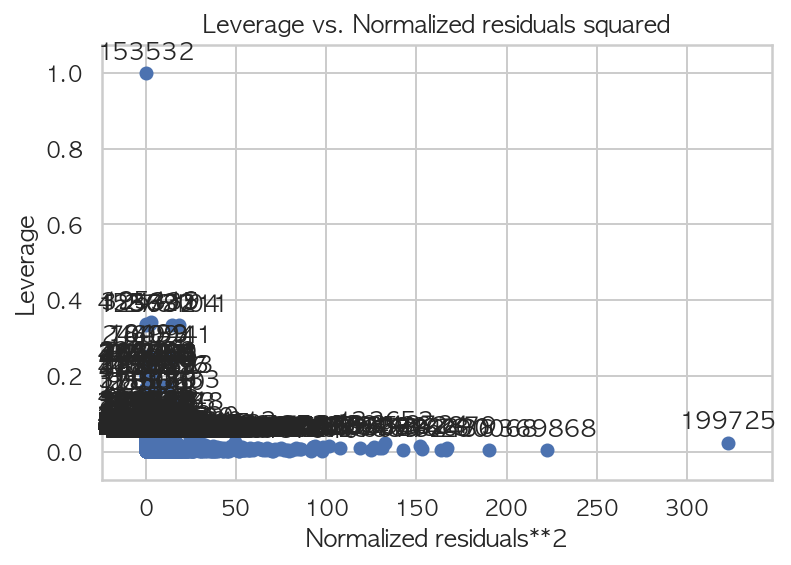

In [203]:
# 쿡스 디스턴스
# x축: 표준화 잔차의 제곱, y축: 레버리지 값
sm.graphics.plot_leverage_resid2(result, ax=(16,8))
plt.show()

In [211]:
df.columns

Index(['id', 'price', 'year', 'manufacturer', 'model', 'cylinders', 'fuel',
       'odometer', 'title_status', 'transmission', 'vin', 'drive', 'type',
       'paint_color', 'state'],
      dtype='object')

In [66]:
df.dtypes

id                int64
price             int64
year            float64
manufacturer     object
model            object
cylinders        object
fuel             object
odometer        float64
title_status     object
transmission     object
vin              object
drive            object
type             object
paint_color      object
state            object
dtype: object

In [219]:
df['odometer'].corr(df['year'])

-0.44154423809029186

In [220]:
df.corrwith(df['price'])

id         -0.04
price       1.00
year        0.43
odometer   -0.51
dtype: float64

#### 독립변수 중 실수형 데이터 분석

#### odometer 데이터 분석

In [164]:
# odometer 데이터 counts 정렬
raw_data['odometer'].value_counts().sort_values(ascending=True)

64694.00        1
159897.00       1
81338.00        1
193240.00       1
110458.00       1
109718.00       1
228199.00       1
14263.00        1
130487.00       1
54282.00        1
39974.00        1
114101.00       1
162665.00       1
107922.00       1
7178.00         1
56666.00        1
156534.00       1
65237.00        1
59036.00        1
213988.00       1
162677.00       1
162678.00       1
103192.00       1
144569.00       1
130481.00       1
81131.00        1
57048.00        1
195423.00       1
54726.00        1
97711.00        1
97710.00        1
17981.00        1
174318.00       1
49792.00        1
104986.00       1
138134.00       1
20632.00        1
20331.00        1
82542.00        1
22438.00        1
162661.00       1
81331.00        1
119334.00       1
162674.00       1
195418.00       1
97696.00        1
128782.00       1
100710.00       1
114850.00       1
81318.00        1
86234.00        1
60404.00        1
75389.00        1
217124.00       1
32617.00        1
27428.00  

In [93]:
raw_data['odometer'].value_counts().sort_index(ascending=False)

1000000.00      8
999999.00      13
997500.00       1
995000.00       2
990000.00       1
988600.00       1
971234.00       1
970020.00       1
970000.00       1
968606.00       1
940000.00       3
938950.00       1
920200.00       1
916000.00       1
915000.00       1
910580.00       1
900000.00       2
899566.00       1
897120.00       1
892000.00       1
890000.00       2
888888.00       1
885148.00       1
884651.00       1
884582.00       1
880000.00       1
866166.00       1
863000.00       1
860000.00       2
840000.00       1
837010.00       1
813180.00       1
809217.00       2
800000.00       1
795862.00       1
780000.00       1
762000.00       1
750000.00       1
740921.00       1
733694.00       1
731897.00       2
720398.00       1
720000.00       1
705000.00       1
703647.00       1
696162.00       1
690000.00       2
654906.00       1
640000.00       2
620000.00       1
617109.00       1
613030.00       1
612000.00       1
606700.00       1
600000.00       1
585501.00 

In [96]:
raw_data[raw_data['odometer'] >= 840000.00]

,id,price,year,manufacturer,model,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state
45315,7048305335,6500,2009.00,volvo,vnl,6 cylinders,diesel,1000000.00,clean,manual,4wd,truck,red,wi
46250,7045586018,1700,2005.00,cadillac,deville,8 cylinders,gas,940000.00,clean,automatic,fwd,sedan,silver,wi
50218,7049882504,7000,1976.00,ford,f700,8 cylinders,gas,900000.00,clean,manual,rwd,truck,white,al
59951,7044927928,16999,2006.00,subaru,impreza wrx sti,4 cylinders,gas,995000.00,clean,manual,4wd,sedan,silver,ak
63100,7046845634,2750,1947.00,chrysler,royal ?,8 cylinders,gas,1000000.00,clean,automatic,fwd,coupe,custom,az
63195,7043973617,34500,1966.00,toyota,land cruiser fj40,8 cylinders,gas,999999.00,clean,manual,4wd,SUV,red,az
65640,7049357769,7500,2013.00,toyota,corolla,4 cylinders,gas,916000.00,clean,automatic,fwd,sedan,white,az
79873,7038981006,26999,2013.00,toyota,tundra,8 cylinders,gas,860000.00,clean,automatic,4wd,pickup,grey,ca
84877,7044982730,24500,2015.00,ford,f150 4x4,6 cylinders,gas,940000.00,clean,automatic,4wd,truck,silver,ca
89557,7048029858,4000,2006.00,toyota,camry xle,6 cylinders,gas,920200.00,salvage,automatic,fwd,sedan,silver,ca


In [18]:
raw_data['odometer'].max()

1000000.0

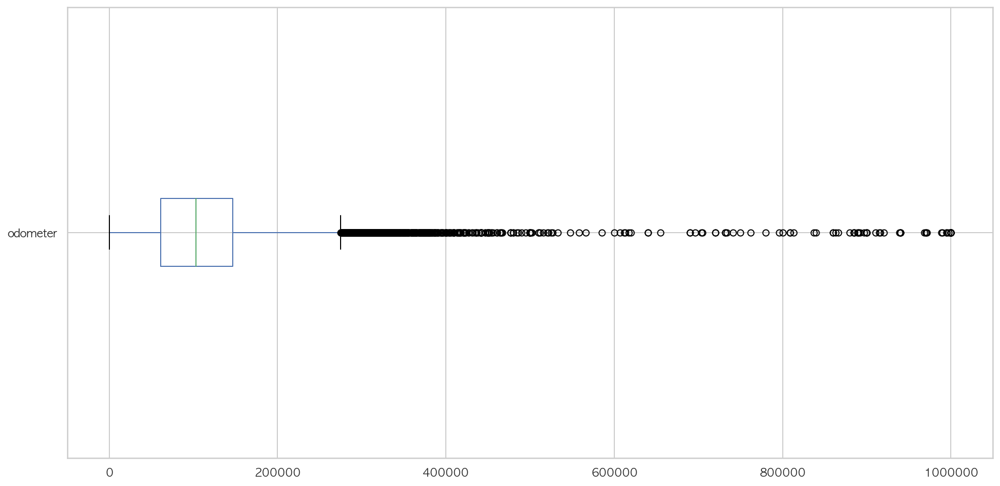

In [85]:
raw_data.boxplot(column=['odometer'], figsize=(16,8), vert=0);

#### odometer, pirce 데이터 분석

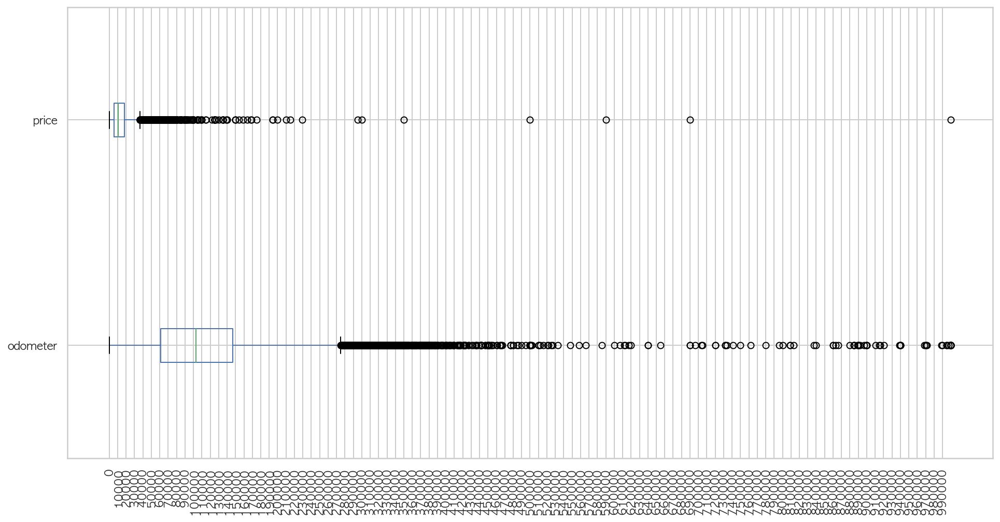

In [81]:
# price 박스플롯 : 3만 ~ 4만
# odometer 박스플롯 : 27만 ~ 28만
raw_data.boxplot(column=['odometer', 'price'], figsize=(16,8), vert=0)
plt.xticks(np.arange(0, 1000000, step=10000), rotation=90);

#### year 데이터 분석

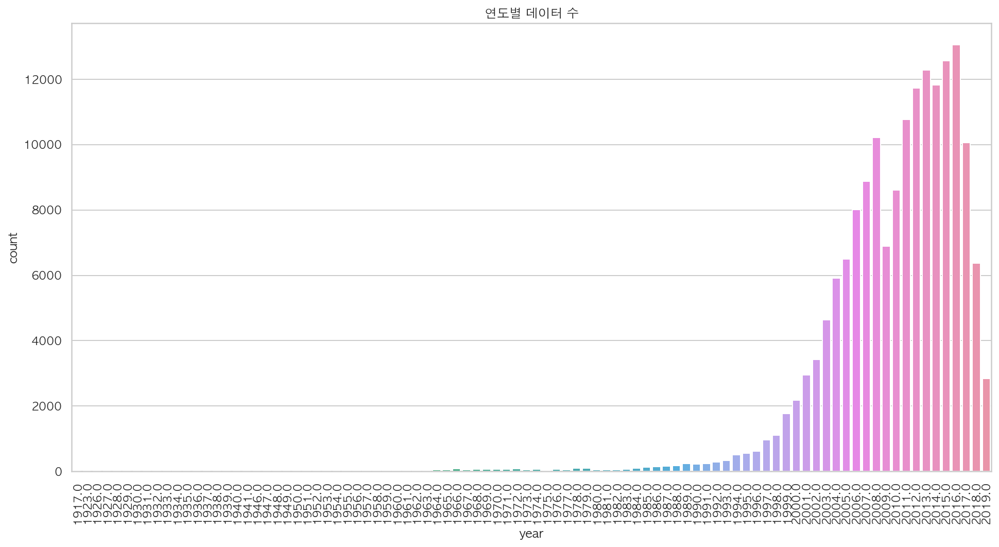

CPU times: user 1.87 s, sys: 225 ms, total: 2.1 s
Wall time: 2.1 s


In [91]:
# 주행거리, 가격 데이터의 countplot은 그려지지 않음
# year 데이터 그래프
plt.figure(figsize=(16,8))
ax = sns.countplot(x='year', data=raw_data)
plt.title('연도별 데이터 수')
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
plt.show()

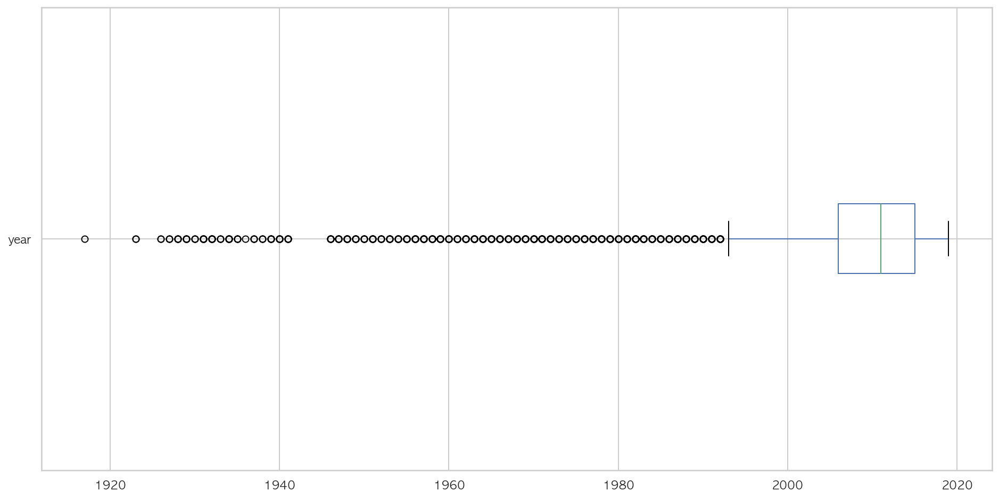

In [44]:
# year 박스플롯
raw_data.boxplot('year', vert=0, figsize=(16,8))
xlim

In [97]:
# 추가 전처리 
# 1. year : 연도별 등록 수 2000개 이하 제외 : 1917년 ~ 1999년까지 총 9759개
# raw_data = raw_data[raw_data['year'] >= 2000]
# 2. price : $ 5만 이상 제외 : 1089개
raw_data = raw_data[raw_data['price'] <= 100000]

print('='*21)
print('추가전처리 후 갯수 : ', len(raw_data)) # 159558개, 모델 컬럼 추가 후 : 158714개
print()

추가전처리 후 갯수 :  168832



In [101]:
raw_data['year'].value_counts().describe()

count      93.00
mean     1815.40
std      3633.91
min         1.00
25%        10.00
50%        59.00
75%       621.00
max     13057.00
Name: year, dtype: float64

In [106]:
raw_data['year'].value_counts().sort_index(ascending=False)

2020.00      102
2019.00     2828
2018.00     6363
2017.00    10065
2016.00    13057
2015.00    12561
2014.00    11818
2013.00    12279
2012.00    11727
2011.00    10765
2010.00     8615
2009.00     6886
2008.00    10213
2007.00     8885
2006.00     8006
2005.00     6496
2004.00     5914
2003.00     4630
2002.00     3416
2001.00     2948
2000.00     2183
1999.00     1761
1998.00     1109
1997.00      970
1996.00      621
1995.00      549
1994.00      509
1993.00      338
1992.00      281
1991.00      236
1990.00      223
1989.00      231
1988.00      175
1987.00      164
1986.00      149
1985.00      120
1984.00       93
1983.00       67
1982.00       54
1981.00       48
1980.00       42
1979.00       95
1978.00       99
1977.00       56
1976.00       59
1975.00       32
1974.00       65
1973.00       53
1972.00       81
1971.00       59
1970.00       58
1969.00       68
1968.00       61
1967.00       56
1966.00       76
1965.00       54
1964.00       56
1963.00       22
1962.00       

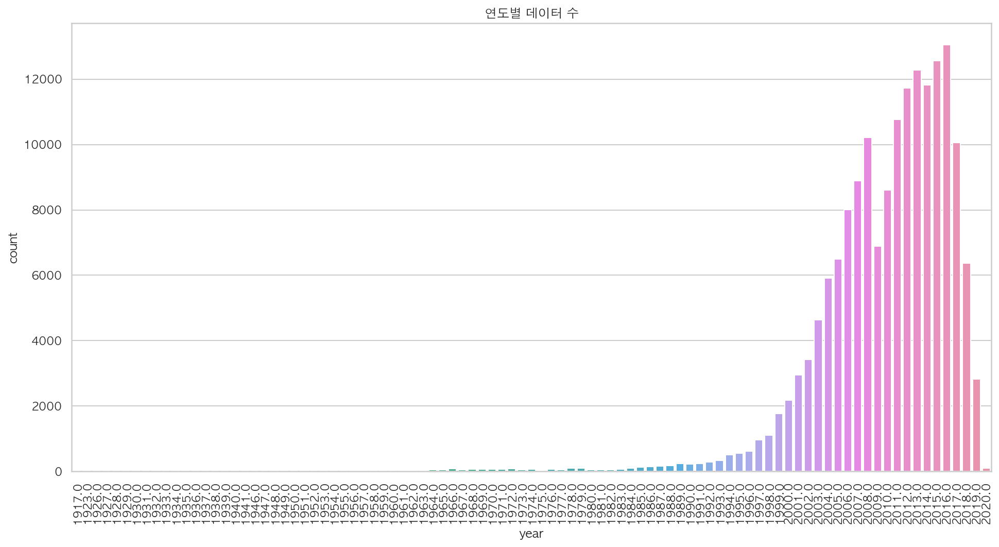

In [98]:
# year 데이터 그래프
plt.figure(figsize=(16,8))
ax = sns.countplot(x='year', data=raw_data)
plt.title('연도별 데이터 수')
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
# plt.tight_layout()
plt.show()

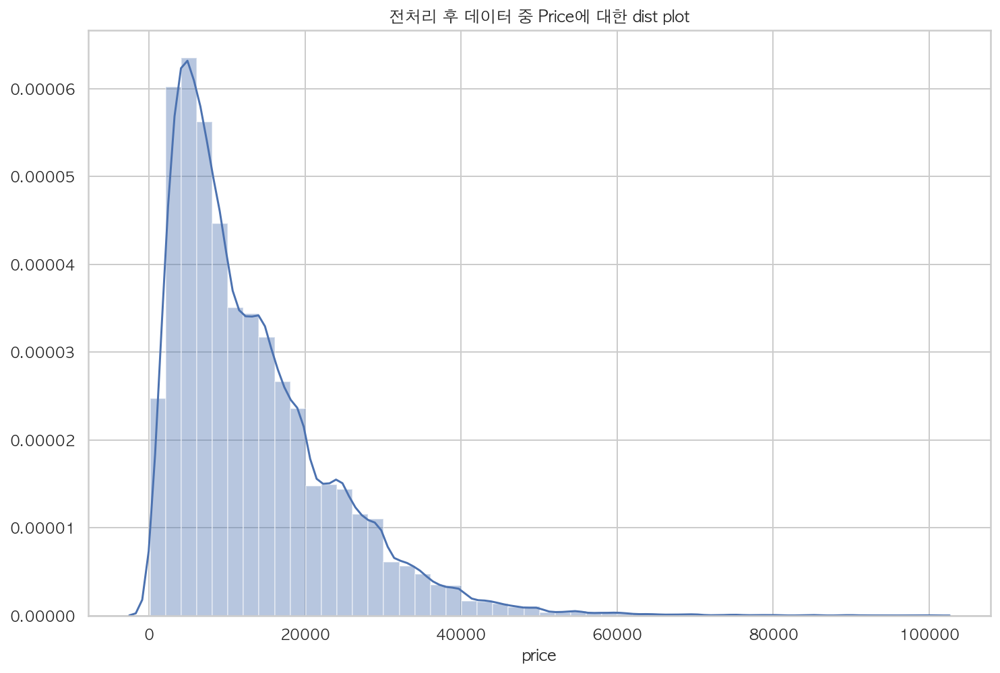

In [99]:
# price dist plot
plt.figure(figsize=(12,8))
sns.distplot(raw_data['price'], kde=True)
plt.title('전처리 후 데이터 중 Price에 대한 dist plot')
plt.show()

In [100]:
# 스케일링
model = sm.OLS.from_formula("scale(price) ~ C(year) + C(manufacturer) \
+ C(cylinders) + C(fuel) + scale(odometer) + C(title_status) + C(transmission) \
+ C(drive) + C(type) + C(paint_color) + C(state) + 0", data=raw_data)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:           scale(price)   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                     2034.
Date:                Wed, 25 Mar 2020   Prob (F-statistic):               0.00
Time:                        18:20:29   Log-Likelihood:            -1.0223e+05
No. Observations:              126588   AIC:                         2.048e+05
Df Residuals:                  126438   BIC:                         2.062e+05
Df Model:                         149                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
C(ye